## Generating and Visualizing Trial-Averaged Dynamic Spectra

In [2]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
import pywt
import math
import scipy.stats as st
from matplotlib.colors import LogNorm

In [127]:
def dynamic_spectrum(segment, fps, f_range=(2, 60), num_freqs=100):
    """
    Compute a wavelet spectrogram of a signal segment 
    
    Parameters:
        segment: 1D numpy array (signal trace for a single trial)
        fps: frames per second (sampling rate)
        f_range: frequency range (Hz)
        num_freqs: number of frequency bins (log spaced)
    Returns:
        power: normalized wavelet magnitude (freq x time)
        freqs: corresponding frequencies in Hz
    """
    dt = 1 / fps
    freqs = np.logspace(np.log10(f_range[0]), np.log10(f_range[1]), num_freqs)
    
    # Morelet wavelet
    wavelet = 'cmor2.0-1.0'
    
    # Match MATLAB scale construction
    scales = pywt.scale2frequency(wavelet, 1.0) / freqs * fps

    # Compute wavelet transform
    coeffs, actual_freqs = pywt.cwt(segment, scales, wavelet, sampling_period=dt)
    
    # Normalize as MATLAB: abs(wt) / sqrt(freq)
    amplitude = np.abs(coeffs) / np.sqrt(actual_freqs[:, np.newaxis])
    
    return amplitude, actual_freqs

### Loading and plotting mean dynamic spectra from h5 file
The dynamic spectra code:
- Masks to extract V1
- Finds 5 second segments surrounding stimulus onset (-2, +3)
- Averages over V1 to get 1D time trace
- Computes wavelet spectrogram of trial segment 
- Normalizes amplitude at each frequency by sqrt(freq)
- Takes me mean of all the trial spectrograms (for each trial type)
- Does quantile normalization (wt - q01)/q10
- Converts to % by multiplying by 100

This plotting code:
- Loads these mean ds
- Crops in time and frequency
- Crops dynamic range of each colourbar to 1st and 90th percentiles (each trial type plot has its own colourbar)

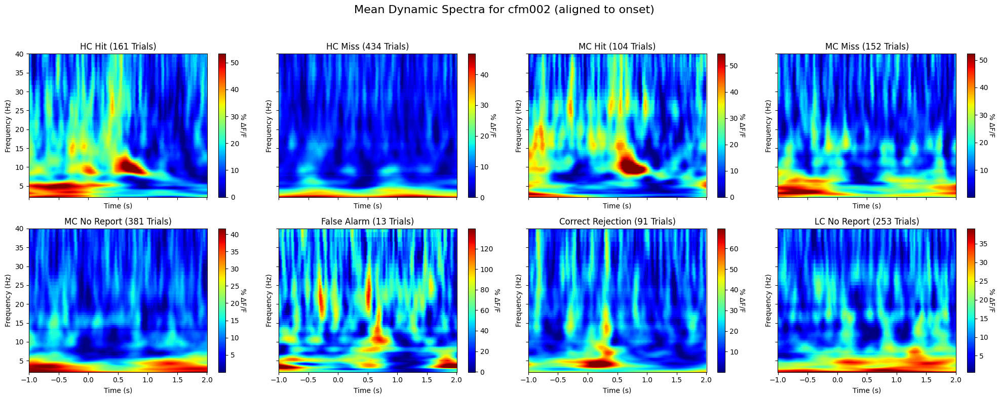

In [50]:
# Parameters
mouse_name = 'cfm002'
align_to = 'onset'
f_range = (2, 40)  # Frequency range to display
time_window = (-1, 2)  # Seconds
filename = f'results/{mouse_name}_dynamic_spec_denoised_2.h5'

# Trial types in same order as saved
trial_type_names = [
    'HC Hit', 'HC Miss',
    'MC Hit', 'MC Miss', 'MC No Report',
    'False Alarm', 'Correct Rejection', 'LC No Report'
]

# Load data
with h5py.File(filename, 'r') as h5f:
    fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
    axs = axs.ravel()

    for i, trial_type in enumerate(trial_type_names):
        group = h5f[trial_type]
        wt_plot = group["MeanDynamicSpectrum"][()]
        freqs = group.attrs["Frequencies"]
        time_axis = group.attrs["Time_Array"]
        ds = group["DynamicSpectra"][()]
        
        # Restrict time range
        time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
        time_axis_cut = time_axis[time_mask]
        wt_plot_cut = wt_plot[:, time_mask]

        # Plotting
        ax = axs[i]
        cs = np.quantile(wt_plot_cut, [0.01, 0.99])
        pcm = ax.pcolormesh(time_axis_cut, freqs, wt_plot_cut, shading='auto', cmap='jet')
        pcm.set_clim(cs[0], cs[1])

        ax.set_title(f'{trial_type} ({len(ds)} Trials)', fontsize=12)
        ax.set_xlabel("Time (s)", fontsize=10)
        ax.set_ylabel("Frequency (Hz)", fontsize=10)
        ax.set_ylim(f_range)

        # Add individual colorbar to each subplot
        cbar = fig.colorbar(pcm, ax=ax)
        cbar.ax.set_ylabel("% ΔF/F", rotation=270, labelpad=10)

    fig.suptitle(f"Mean Dynamic Spectra for {mouse_name} (aligned to {align_to})", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for title
    plt.show()

#### Same as above but plotting with a shared colourbar

C:\Users\Katie\AppData\Local\Temp\ipykernel_34316\15736820.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbar


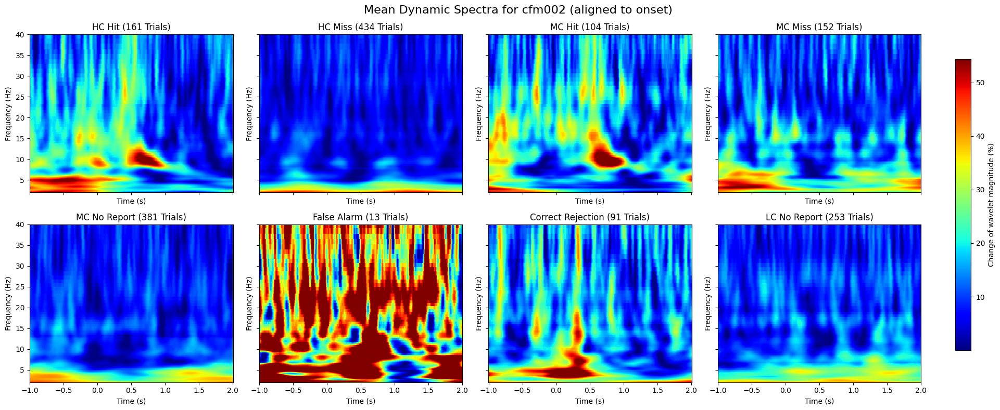

In [48]:
# Step 1: Preload all spectra to determine global color limits
all_spectra = []
with h5py.File(filename, 'r') as h5f:
    for trial_type in trial_type_names:
        group = h5f[trial_type]
        wt_plot = group["MeanDynamicSpectrum"][()]
        time_axis = group.attrs["Time_Array"]

        # Mask to desired time window
        time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
        wt_plot_cut = wt_plot[:, time_mask]
        all_spectra.append(wt_plot_cut)

# Step 2: Compute shared color scale from all data
global_min, global_max = np.quantile(np.concatenate([s.flatten() for s in all_spectra]), [0.01, 0.95])

# Step 3: Plotting
fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
axs = axs.ravel()

with h5py.File(filename, 'r') as h5f:
    for i, (trial_type, wt_plot_cut) in enumerate(zip(trial_type_names, all_spectra)):
        group = h5f[trial_type]
        freqs = group.attrs["Frequencies"]
        time_axis = group.attrs["Time_Array"]
        ds = group["DynamicSpectra"][()]
        time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
        time_axis_cut = time_axis[time_mask]

        ax = axs[i]
        pcm = ax.pcolormesh(time_axis_cut, freqs, wt_plot_cut, shading='nearest', cmap='jet',
                            vmin=global_min, vmax=global_max)

        ax.set_title(f'{trial_type} ({len(ds)} Trials)', fontsize=12)
        ax.set_xlabel("Time (s)", fontsize=10)
        ax.set_ylabel("Frequency (Hz)", fontsize=10)
        ax.set_ylim(f_range)

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])  # Position: [left, bottom, width, height]
fig.colorbar(pcm, cax=cbar_ax, label="Change of wavelet magnitude (%)")

fig.suptitle(f"Mean Dynamic Spectra for {mouse_name} (aligned to {align_to})", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbar
plt.show()

### Common Quartiles for All Plots

In [114]:
def quartiles(h5_path):
    trial_type_names = [
        'HC Hit', 'HC Miss',
        'MC Hit', 'MC Miss', 'MC No Report',
        'False Alarm', 'Correct Rejection', 'LC No Report'
    ]

    all_ds = []

    with h5py.File(h5_path, 'r') as h5f:
        for trial_type in trial_type_names:
            if trial_type in h5f:
                group = h5f[trial_type]
                ds = group["DynamicSpectra"][()]  # shape: (n_trials, n_freqs, n_timepoints)
                ds_cropped = ds[:, :, int(157*0.1):int(157*4.9)]      # remove first and last 0.1s
                all_ds.append(ds_cropped)

    # Concatenate across all trial types along the trial axis
    combined_ds = np.concatenate(all_ds, axis=0)  # shape: (total_trials, n_freqs, n_timepoints)

    # Compute mean power across trials
    mean_power = np.nanmean(combined_ds, axis=0)  # shape: (n_freqs, n_timepoints)

    # Compute 1st and 10th quantile across time for each frequency
    q01 = np.quantile(mean_power, 0.01, axis=1, keepdims=True)  # shape: (n_freqs, 1)
    q10 = np.quantile(mean_power, 0.10, axis=1, keepdims=True)  # shape: (n_freqs, 1)
    q99 = np.quantile(mean_power, 0.99, axis=1, keepdims=True)  # shape: (n_freqs, 1)

    spread = q10.squeeze() - q01.squeeze()
    plt.plot(freqs, spread)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("q10 - q01 spread")
    plt.title("Dynamic Range per Frequency Band")
    plt.grid(True)
    plt.show()

    spread = q10.squeeze() - q01.squeeze()
    plt.plot(freqs[70:], q10.squeeze()[70:], label='q10')
    plt.plot(freqs[70:], q99.squeeze()[70:], label='q99')
    plt.xlabel("Frequency (Hz)")
    plt.legend()
    plt.title("Comparing 10th and 99th percentile")
    plt.grid(True)
    plt.show()

    return q01, q10

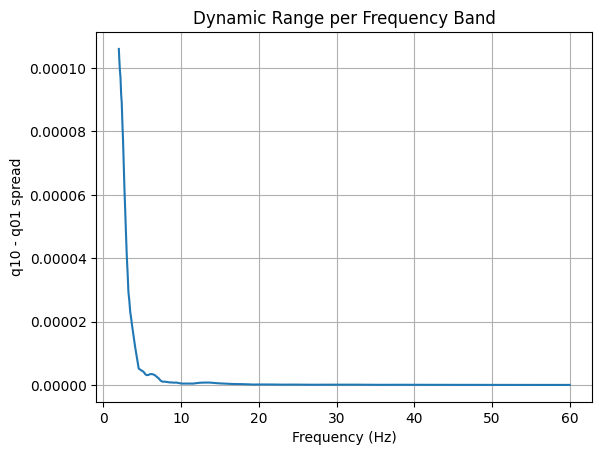

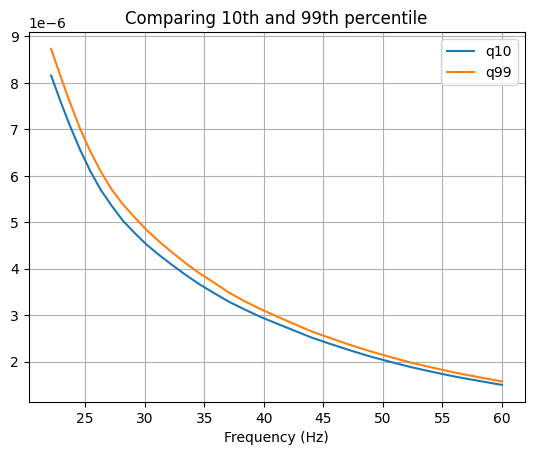

In [115]:
q01, q10 = quartiles(filename)

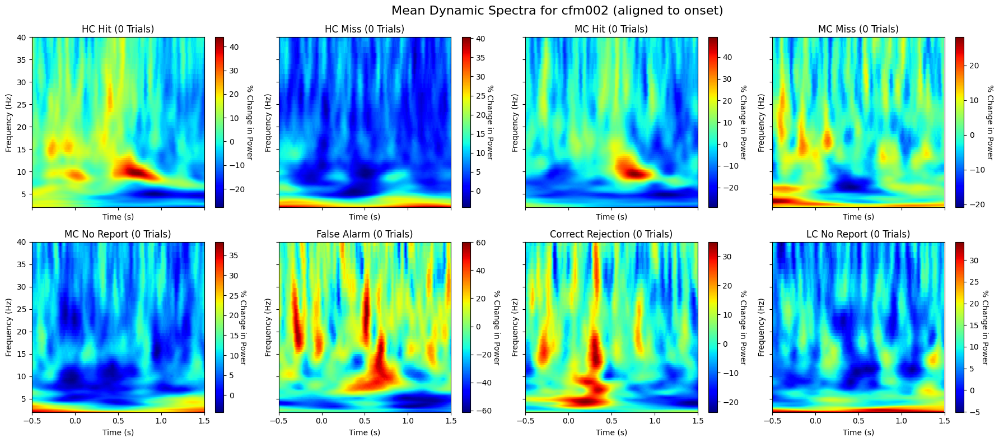

In [125]:
# Parameters
time_window = (-0.5, 1.5)
f_range = (2, 40)

# Linear-scaled plot
fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
axs = axs.ravel()

for i, trial_type in enumerate(trial_type_names):
    all_power1 = []
    with h5py.File(filename, 'r') as h5f:
        group = h5f[trial_type]
        ds = group["DynamicSpectra"][()]
        all_signals = group["TimeSignals"][()]
        freqs = group.attrs["Frequencies"]
        time_axis = group.attrs["Time_Array"]

         # Time window masking
        time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
        time_axis_cut = time_axis[time_mask]

    mean_power = np.mean(ds[:,:,time_mask], axis=0)

    mean_power = ((mean_power - q01) / (q10 + 1e-10))*100

    ax = axs[i]
    cs = np.quantile(mean_power, [0.01, 0.99])
    pcm = ax.pcolormesh(time_axis_cut, freqs, mean_power, shading='auto', cmap='jet')

    ax.set_title(f'{trial_type} ({len(all_power1)} Trials)', fontsize=12)
    ax.set_xlabel("Time (s)", fontsize=10)
    ax.set_ylabel("Frequency (Hz)", fontsize=10)
    ax.set_ylim(f_range)

    cbar = fig.colorbar(pcm, ax=ax)
    cbar.ax.set_ylabel("% Change in Power", rotation=270, labelpad=10)

fig.suptitle(f"Mean Dynamic Spectra for {mouse_name} (aligned to {align_to})", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

C:\Users\Katie\AppData\Local\Temp\ipykernel_29136\2266361196.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


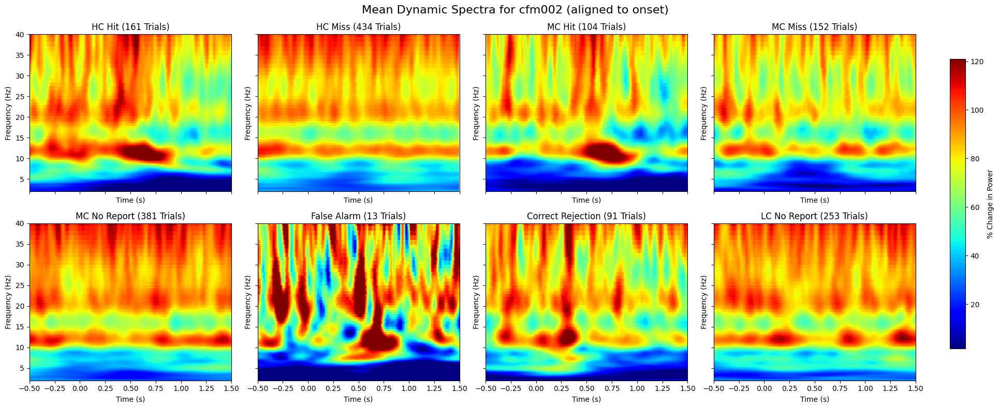

In [78]:
all_normalized = []
all_titles = []
all_freqs = []
all_times = []
time_axis_cut = None
frequencies = None

for trial_type in trial_type_names:
    all_power1 = []
    with h5py.File(filename, 'r') as h5f:
        group = h5f[trial_type]
        all_signals = group["TimeSignals"][()]
        freqs = group.attrs["Frequencies"]
        time_axis = group.attrs["Time_Array"]

        # Time window masking
        time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
        time_axis_cut = time_axis[time_mask]

        for signal in all_signals:
            fps = len(signal) / 5
            power_norm, frequencies = dynamic_spectrum(signal, fps)
            all_power1.append(power_norm[:, time_mask])

    all_power = np.stack(all_power1)
    mean_power = np.mean(all_power, axis=0)
    mean_power = ((mean_power - q01) / (q10 + 1e-10)) * 100

    all_normalized.append(mean_power)
    all_titles.append(f'{trial_type} ({len(all_power1)} Trials)')
    all_freqs.append(frequencies)
    all_times.append(time_axis_cut)

# Compute global color limits from all plots
combined = np.concatenate([mp[np.isfinite(mp)].flatten() for mp in all_normalized])
vmin, vmax = np.percentile(combined, [10, 99])

# Plot
fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
axs = axs.ravel()

for i, (ax, mean_power, title, freqs_i, times_i) in enumerate(zip(
        axs, all_normalized, all_titles, all_freqs, all_times)):
    
    pcm = ax.pcolormesh(times_i, freqs_i, mean_power, shading='auto',
                        cmap='jet', vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize=12)
    ax.set_xlabel("Time (s)", fontsize=10)
    ax.set_ylabel("Frequency (Hz)", fontsize=10)
    ax.set_ylim(f_range)

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
fig.colorbar(pcm, cax=cbar_ax, label="% Change in Power")

fig.suptitle(f"Mean Dynamic Spectra for {mouse_name} (aligned to {align_to})", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

### Plotting without quantile-based normalization

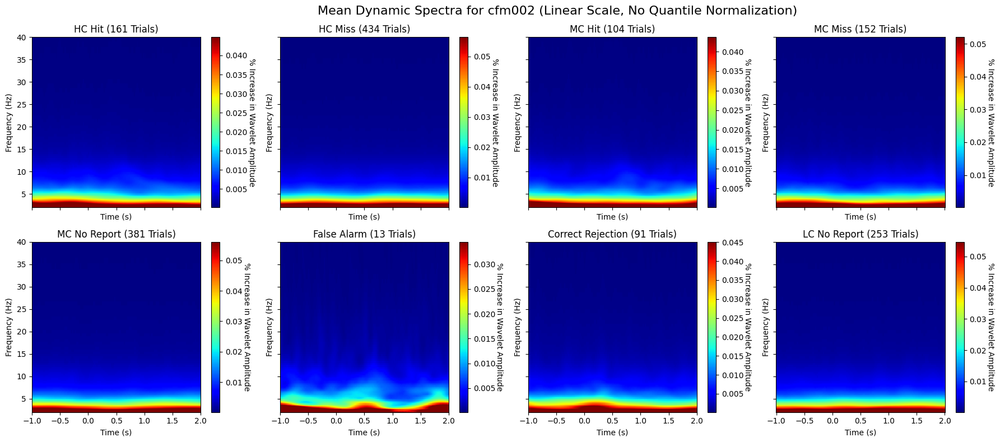

0.0001496827561156846 0.044799791178959714 -3.8248282287495394 -1.348724010333036
0.00015739650690490772 0.056322382275512096 -3.8030049101520302 -1.2493189840643024
0.00014707047801560842 0.043680631746207045 -3.8324744960124852 -1.359711089124115
0.0001499085075818751 0.05207020932078137 -3.824173719446467 -1.2834106764691593
0.00016189095205888213 0.056035849583943614 -3.790777422900149 -1.2515340391525438
0.00014263453760094717 0.03449197408103858 -3.845775301459112 -1.46228194892146
0.00014917369981420819 0.04504014676673802 -3.8263077387426248 -1.3464002029728603
0.0001605954274363567 0.05463824127389623 -3.794266824358889 -1.2625032884139105


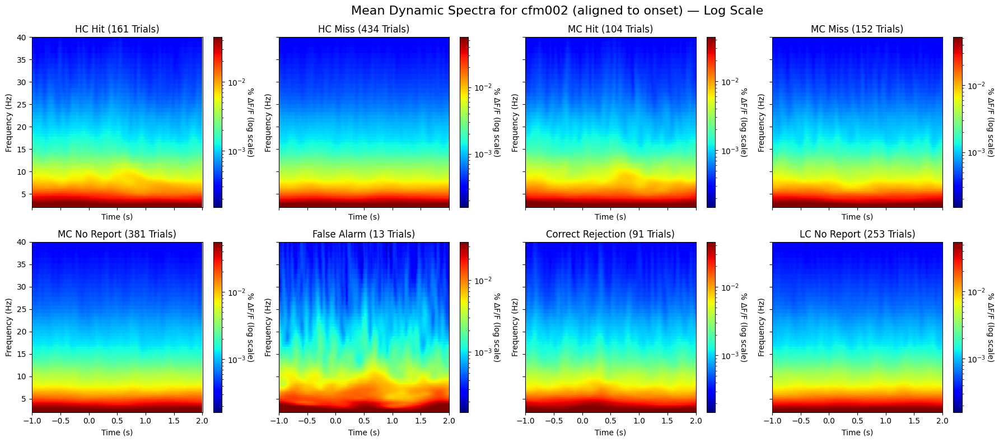

In [110]:
# Parameters
time_window = (-1, 2)
f_range = (2, 40)

# Linear-scaled plot
fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
axs = axs.ravel()

for i, trial_type in enumerate(trial_type_names):
    with h5py.File(filename, 'r') as h5f:
        group = h5f[trial_type]
        ds = group["DynamicSpectra"][()]*100
        freqs = group.attrs["Frequencies"][()]
        time_axis = group.attrs["Time_Array"][()]

    # Mask to desired time window
    time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
    ds = ds[:, :, time_mask]
    time_axis_cut = time_axis[time_mask]

    # Compute mean across trials
    mean_power = np.nanmean(ds, axis=0)

    ax = axs[i]
    cs = np.quantile(mean_power, [0.01, 0.90])
    pcm = ax.pcolormesh(time_axis_cut, freqs, mean_power, shading='auto', cmap='jet')
    pcm.set_clim(cs[0], cs[1])

    ax.set_title(f'{trial_type} ({len(ds)} Trials)', fontsize=12)
    ax.set_xlabel("Time (s)", fontsize=10)
    ax.set_ylabel("Frequency (Hz)", fontsize=10)
    ax.set_ylim(f_range)

    cbar = fig.colorbar(pcm, ax=ax)
    cbar.ax.set_ylabel("% Increase in Wavelet Amplitude", rotation=270, labelpad=10)

fig.suptitle(f"Mean Dynamic Spectra for {mouse_name} (Linear Scale, No Quantile Normalization)", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

# -----------------------------------
# Log-scaled plot
# -----------------------------------

fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
axs = axs.ravel()

for i, trial_type in enumerate(trial_type_names):
    with h5py.File(filename, 'r') as h5f:
        group = h5f[trial_type]
        ds = group["DynamicSpectra"][()]*100
        freqs = group.attrs["Frequencies"][()]
        time_axis = group.attrs["Time_Array"][()]

    # Time window masking
    time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
    ds = ds[:, :, time_mask]
    time_axis_cut = time_axis[time_mask]

    # Compute mean power
    mean_power = np.nanmean(ds, axis=0)

    # Ensure positive values for log scale
    mean_power_log = np.where(mean_power <= 0, np.nan, mean_power)
    valid_vals = mean_power_log[np.isfinite(mean_power_log)]

    # Default/fallback
    vmin, vmax = 0.01, 0.1

    q01, q99 = np.nanquantile(valid_vals, [0.01, 0.90])
        # Only update if span is wide enough
    #if q99 > q01 * 2:
    vmin = q01#max(q01, 0.01)
    vmax = q99

    print(q01, q99, np.log10(q01), np.log10(q99))

    ax = axs[i]
    pcm = ax.pcolormesh(
        time_axis_cut, freqs, mean_power_log,
        shading='auto', cmap='jet',
        norm=LogNorm(vmin, vmax=vmax)
    )

    ax.set_title(f'{trial_type} ({len(ds)} Trials)', fontsize=12)
    ax.set_xlabel("Time (s)", fontsize=10)
    ax.set_ylabel("Frequency (Hz)", fontsize=10)
    ax.set_ylim(f_range)

    cbar = fig.colorbar(pcm, ax=ax)
    cbar.ax.set_ylabel("% ΔF/F (log scale)", rotation=270, labelpad=10)

fig.suptitle(f"Mean Dynamic Spectra for {mouse_name} (aligned to {align_to}) — Log Scale", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

### Computing without sqrt(freq) normalization

In [60]:
def dynamic_spectrum_2(segment, fps, f_range=(2, 40), num_freqs=100):
    """
    Compute a wavelet spectrogram of a signal segment 
    
    Parameters:
        segment: 1D numpy array (signal trace for a single trial)
        fps: frames per second (sampling rate)
        f_range: frequency range (Hz)
        num_freqs: number of frequency bins (log spaced)
    Returns:
        power: normalized wavelet magnitude (freq x time)
        freqs: corresponding frequencies in Hz
    """
    dt = 1 / fps
    freqs = np.logspace(np.log10(f_range[0]), np.log10(f_range[1]), num_freqs)
    
    # Morelet wavelet
    wavelet = 'cmor2.0-1.0'
    
    # Match MATLAB scale construction
    scales = pywt.scale2frequency(wavelet, 1.0) / freqs * fps

    # Compute wavelet transform
    coeffs, actual_freqs = pywt.cwt(segment, scales, wavelet, sampling_period=dt)
    
    # Normalize as MATLAB: abs(wt) / sqrt(freq)
    amplitude = np.abs(coeffs)
    
    return amplitude, actual_freqs

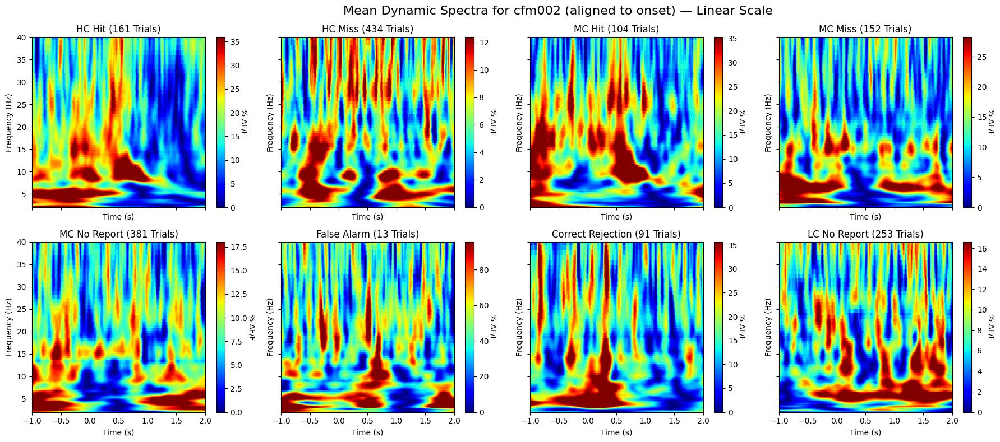

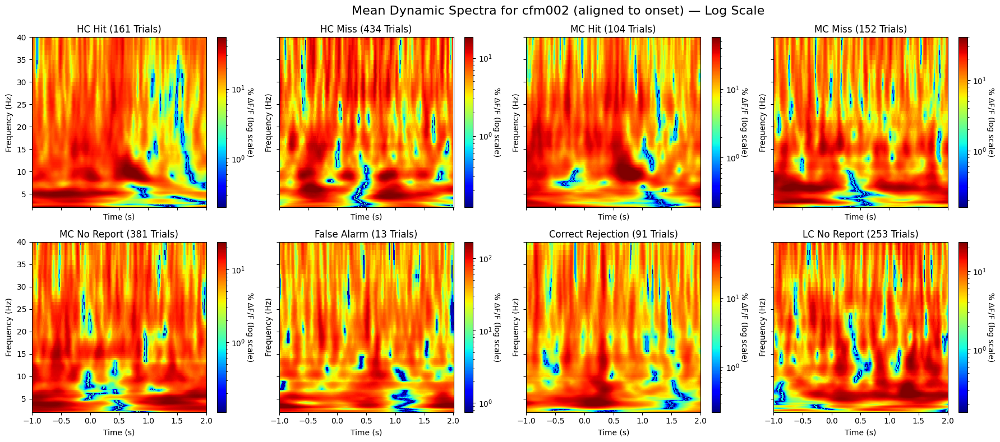

In [ ]:
# Parameters
time_window = (-1, 2)
f_range = (2, 40)

# Linear-scaled plot
fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
axs = axs.ravel()

for i, trial_type in enumerate(trial_type_names):
    all_power1 = []
    with h5py.File(filename, 'r') as h5f:
        group = h5f[trial_type]
        ds = group["DynamicSpectra"]
        all_signals = group["TimeSignals"][()]
        freqs = group.attrs["Frequencies"]
        time_axis = group.attrs["Time_Array"]

         # Time window masking
        time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
        time_axis_cut = time_axis[time_mask]

        for signal in all_signals:
            fps = fps = len(signal) / 5
            power_norm, frequencies = dynamic_spectrum(signal, fps)
            all_power1.append(power_norm[:,time_mask])
            
    all_power = np.stack([arr for arr in all_power1])
    mean_power = np.mean(all_power, axis=0)

    q01 = np.quantile(mean_power, 0.01, axis=1, keepdims=True)
    q10 = np.quantile(mean_power, 0.10, axis=1, keepdims=True)
    mean_power = (mean_power - q01) / (q10 + 1e-10) 

    ax = axs[i]
    cs = np.quantile(mean_power, [0.01, 0.90])
    pcm = ax.pcolormesh(time_axis_cut, frequencies, mean_power, shading='auto', cmap='jet')
    pcm.set_clim(cs[0], cs[1])

    ax.set_title(f'{trial_type} ({len(all_power1)} Trials)', fontsize=12)
    ax.set_xlabel("Time (s)", fontsize=10)
    ax.set_ylabel("Frequency (Hz)", fontsize=10)
    ax.set_ylim(f_range)

    cbar = fig.colorbar(pcm, ax=ax)
    cbar.ax.set_ylabel("% ΔF/F", rotation=270, labelpad=10)

fig.suptitle(f"Mean Dynamic Spectra for {mouse_name} (aligned to {align_to}) — Linear Scale", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

# -----------------------------------
# Log-scaled plot
# -----------------------------------

fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharex=True, sharey=True)
axs = axs.ravel()

for i, trial_type in enumerate(trial_type_names):
    all_power2 = []
    with h5py.File(filename, 'r') as h5f:
        group = h5f[trial_type]
        ds = group["DynamicSpectra"]
        all_signals = group["TimeSignals"][()]
        freqs = group.attrs["Frequencies"]
        time_axis = group.attrs["Time_Array"]

         # Time window masking
        time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
        time_axis_cut = time_axis[time_mask]

        for signal in all_signals:
            fps = fps = len(signal) / 5
            power_norm, frequencies = dynamic_spectrum_2(signal, fps)
            all_power2.append(power_norm[:,time_mask])

    all_power = np.stack([arr for arr in all_power2])
    mean_power = np.mean(all_power, axis=0)

    q01 = np.quantile(mean_power, 0.01, axis=1, keepdims=True)
    q10 = np.quantile(mean_power, 0.10, axis=1, keepdims=True)
    mean_power = (mean_power - q01) / (q10 + 1e-10) *100

    # Ensure positive values for log scale
    mean_power_log = np.where(mean_power <= 0, 1, mean_power)
    valid_vals = mean_power_log[np.isfinite(mean_power_log)]

    # Default/fallback
    vmin, vmax = 1e-2, 1.0

    #if valid_vals.size >= 10:
     #   q01, q99 = np.nanquantile(valid_vals, [0.01, 0.99])
        # Only update if span is wide enough
     #   if q99 > q01 * 2:
     #       vmin = max(q01, 1)
     #       vmax = q99

       # Default/fallback
    vmin, vmax = 0.01, 0.1

    q01, q99 = np.nanquantile(valid_vals, [0.01, 0.99])
        # Only update if span is wide enough
    #if q99 > q01 * 2:
    vmin = q01#max(q01, 0.01)
    vmax = q99

    ax = axs[i]
    pcm = ax.pcolormesh(
        time_axis_cut, frequencies, mean_power_log,
        shading='auto', cmap='jet',
        norm=LogNorm(vmin=vmin, vmax=vmax)
    )

    ax.set_title(f'{trial_type} ({len(all_power2)} Trials)', fontsize=12)
    ax.set_xlabel("Time (s)", fontsize=10)
    ax.set_ylabel("Frequency (Hz)", fontsize=10)
    ax.set_ylim(f_range)

    cbar = fig.colorbar(pcm, ax=ax)
    cbar.ax.set_ylabel("% ΔF/F (log scale)", rotation=270, labelpad=10)

fig.suptitle(f"Mean Dynamic Spectra for {mouse_name} (aligned to {align_to}) — Log Scale", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

## Outlier detection

In [18]:
trial_type = 'HC Hit'

with h5py.File(filename, 'r') as h5f:
    group = h5f[trial_type]
    ds = group["DynamicSpectra"][()]
    freqs = group.attrs["Frequencies"][()]
    time_axis = group.attrs["Time_Array"][()]

In [34]:
def plot_spectra_grid(power_list, freqs, time_arr, title, outliers=None):
    cols = 4
    rows = math.ceil(len(power_list) / cols)
    fig, axs = plt.subplots(rows, cols, figsize=(16, 3 * rows), constrained_layout=True)
    axs = axs.flatten()

    for i, power in enumerate(power_list):
        T, F = np.meshgrid(time_arr, freqs)
        im = axs[i].pcolormesh(T, F, power * 100, shading='auto', cmap='jet')
        axs[i].set_xlabel("Time (s)")
        axs[i].set_ylabel("Freq (Hz)")
        cbar = fig.colorbar(im, ax=axs[i])
        cbar.set_label("Power (% change)", fontsize=8)
        cbar.ax.tick_params(labelsize=8)

    for ax in axs[len(power_list):]:
        ax.axis('off')
    plt.suptitle(title)
    plt.show()

In [44]:
def plot_spectra_grid_norm(power_list, freqs, time_arr, title, outliers=None):
    cols = 4
    rows = math.ceil(len(power_list) / cols)
    fig, axs = plt.subplots(rows, cols, figsize=(16, 3 * rows), constrained_layout=True)
    axs = axs.flatten()

    for i, power in enumerate(power_list):

        q01 = np.quantile(power, 0.01, axis=1, keepdims=True)
        q10 = np.quantile(power, 0.10, axis=1, keepdims=True)
        power = (power - q01) / (q10 + 1e-10) * 100

        T, F = np.meshgrid(time_arr, freqs)
        im = axs[i].pcolormesh(T, F, power, shading='auto', cmap='jet')
        axs[i].set_xlabel("Time (s)")
        axs[i].set_ylabel("Freq (Hz)")
        cbar = fig.colorbar(im, ax=axs[i])
        cbar.set_label("Power (% change)", fontsize=8)
        cbar.ax.tick_params(labelsize=8)

    for ax in axs[len(power_list):]:
        ax.axis('off')
    plt.suptitle(title)
    plt.show()

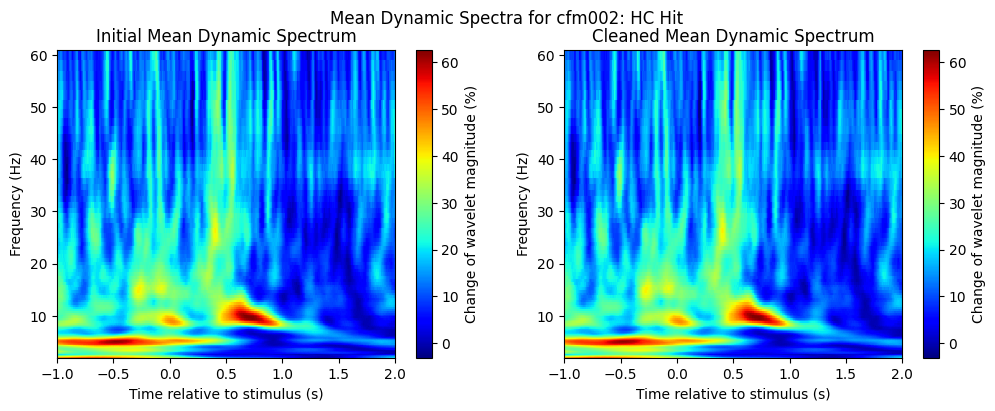

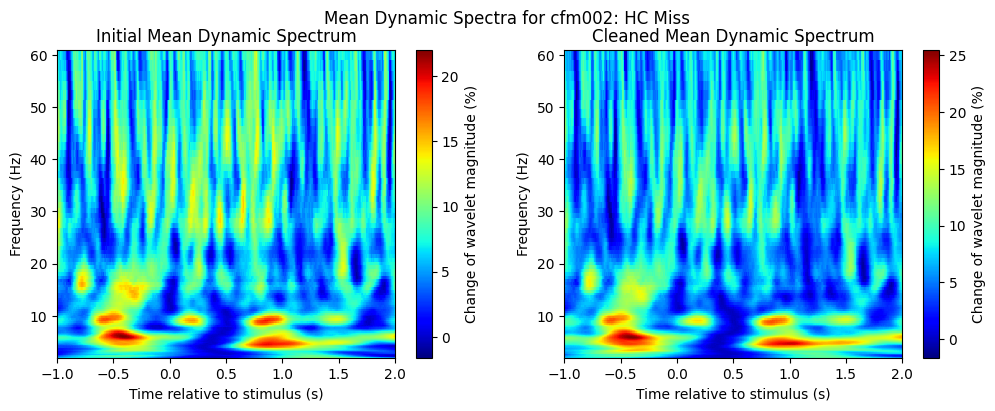

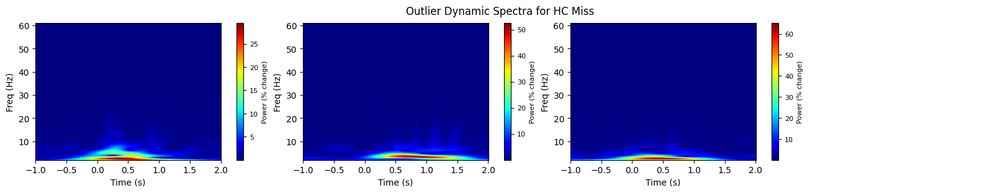

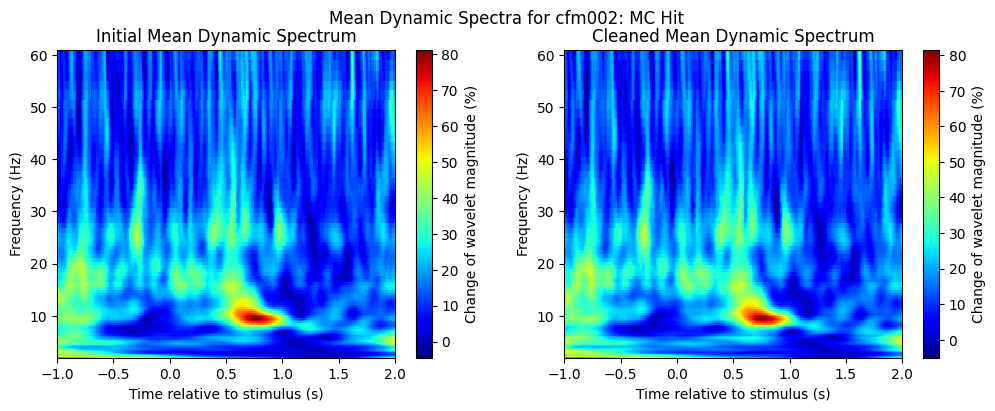

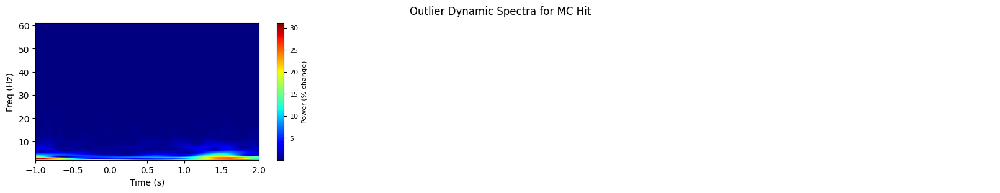

...

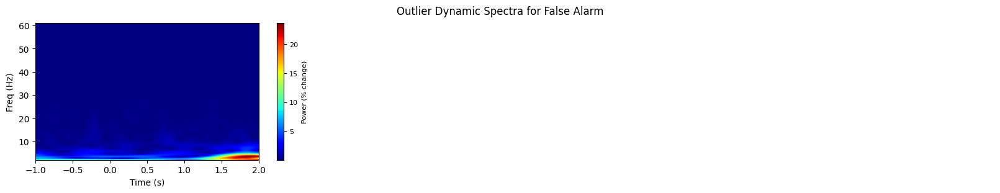

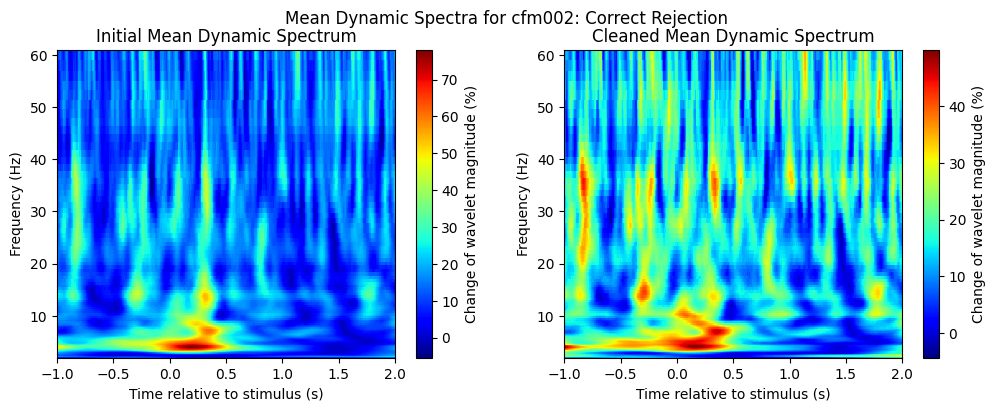

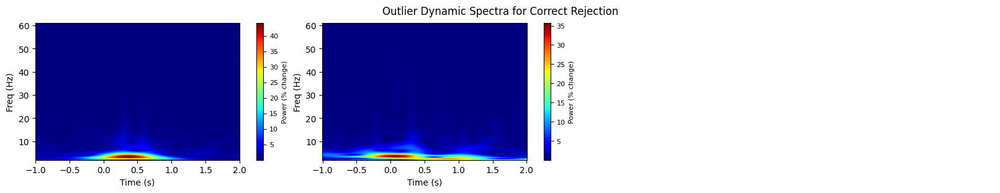

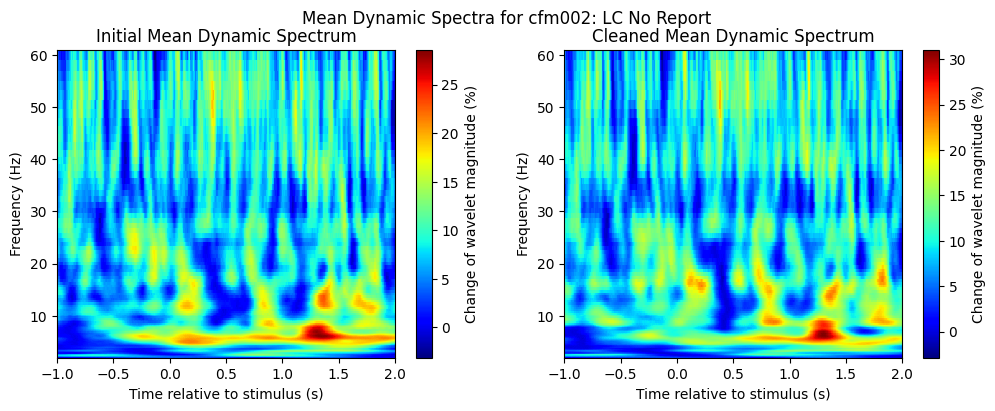

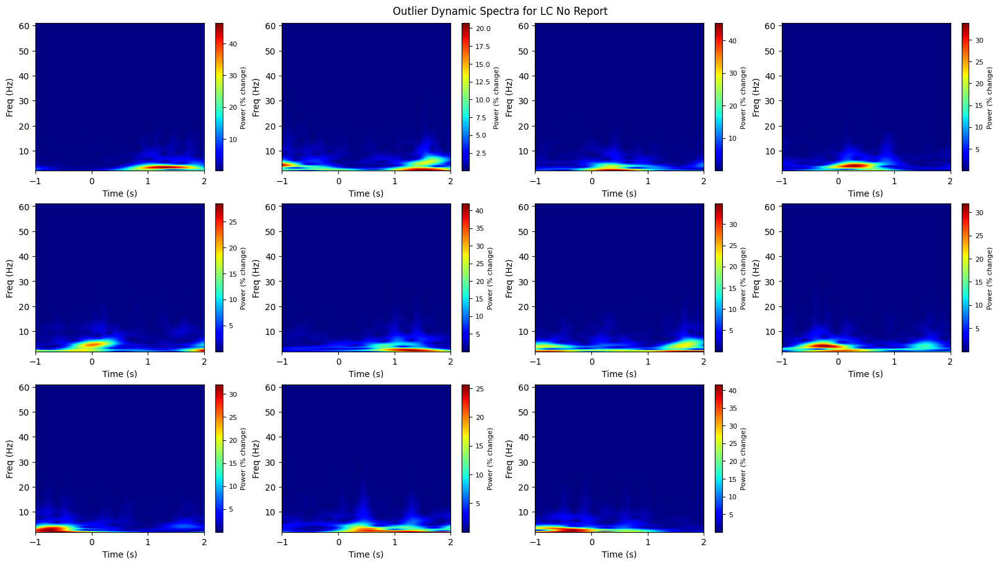

In [ ]:
for trial_type in trial_type_names:
    with h5py.File(filename, 'r') as h5f:
        group = h5f[trial_type]
        ds = group["DynamicSpectra"][()]
        freqs = group.attrs["Frequencies"][()]
        time_axis = group.attrs["Time_Array"][()]

    # Mask to desired time window
    time_mask = (time_axis >= time_window[0]) & (time_axis <= time_window[1])
    ds = ds[:, :, time_mask]
    time_axis = time_axis[time_mask]

    all_power = ds
    trial_ids = np.arange(len(all_power))
    outlier_std = 2.5

    # Initial mean and outlier detection
    mean_power_initial = np.nanmean(all_power, axis=0)
    # Quantile normalization like MATLAB
    q01 = np.quantile(mean_power_initial, 0.01, axis=1, keepdims=True)
    q10 = np.quantile(mean_power_initial, 0.10, axis=1, keepdims=True)
    mean_power_initial = (mean_power_initial - q01) / (q10 + 1e-10) * 100
    total_powers = np.nansum(all_power, axis=(1,2))

    med = np.median(total_powers)
    mad = st.median_abs_deviation(total_powers)
    mad_zscores = np.abs((total_powers - med) / (mad * 1.4826))
    outliers = [tid for tid, z in zip(trial_ids, mad_zscores) if z > outlier_std]

    # Influence testing
    final_outliers = []
    threshold = 0.1
    for i, tid in enumerate(trial_ids):
        if tid not in outliers:
            continue
        mask = np.arange(len(trial_ids)) != i
        mean_wo_trial = np.nanmean(all_power[mask], axis=0)
        q01 = np.quantile(mean_wo_trial, 0.01, axis=1, keepdims=True)
        q10 = np.quantile(mean_wo_trial, 0.10, axis=1, keepdims=True)
        mean_wo_trial = (mean_wo_trial - q01) / (q10 + 1e-10) * 100
        rmse = np.sqrt(np.nanmean((mean_power_initial - mean_wo_trial) ** 2))
        rel_rmse = rmse / np.nanmean(mean_power_initial)
        if rel_rmse > threshold:
            final_outliers.append(tid)

    # Recompute clean mean
    non_outlier_indices = [i for i, tid in enumerate(trial_ids) if tid not in final_outliers]
    all_power_clean = all_power[non_outlier_indices]
    mean_power_clean = np.nanmean(all_power_clean, axis=0)
    q01 = np.quantile(mean_power_clean, 0.01, axis=1, keepdims=True)
    q10 = np.quantile(mean_power_clean, 0.10, axis=1, keepdims=True)
    mean_power_clean = (mean_power_clean - q01) / (q10 + 1e-10) * 100

    T, F = np.meshgrid(time_axis, freqs)
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    for ax, mp, label in zip(axs, [mean_power_initial, mean_power_clean], ["Initial", "Cleaned"]):
        im = ax.pcolormesh(T, F, mp, shading='auto', cmap='jet')
        fig.colorbar(im, ax=ax, label="Change of wavelet magnitude (%)")
        ax.set_xlabel("Time relative to stimulus (s)")
        ax.set_ylabel("Frequency (Hz)")
        ax.set_title(f"{label} Mean Dynamic Spectrum")
    fig.suptitle(f"Mean Dynamic Spectra for {mouse_name}: {trial_type}")
    plt.show()

    if final_outliers:
        outlier_indices = [i for i, tid in enumerate(trial_ids) if tid in final_outliers]
        plot_spectra_grid([all_power[i]*100 for i in outlier_indices], freqs, time_axis,
                            title=f"Outlier Dynamic Spectra for {trial_type}", outliers=final_outliers)

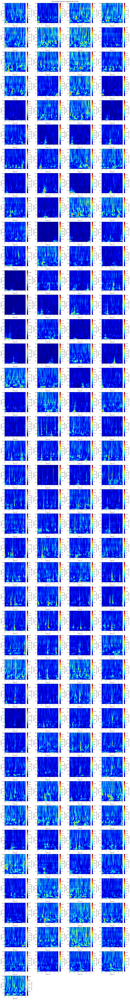

In [46]:
trial_type = 'HC Hit'

with h5py.File(filename, 'r') as h5f:
    group = h5f[trial_type]
    all_power = group["DynamicSpectra"][()]
    freqs = group.attrs["Frequencies"][()]
    time_axis = group.attrs["Time_Array"][()]

plot_spectra_grid_norm([all_power[i] for i in range(len(all_power))], freqs, time_axis,
                                  title=f"Non-Outlier Dynamic Spectra for {trial_type}")

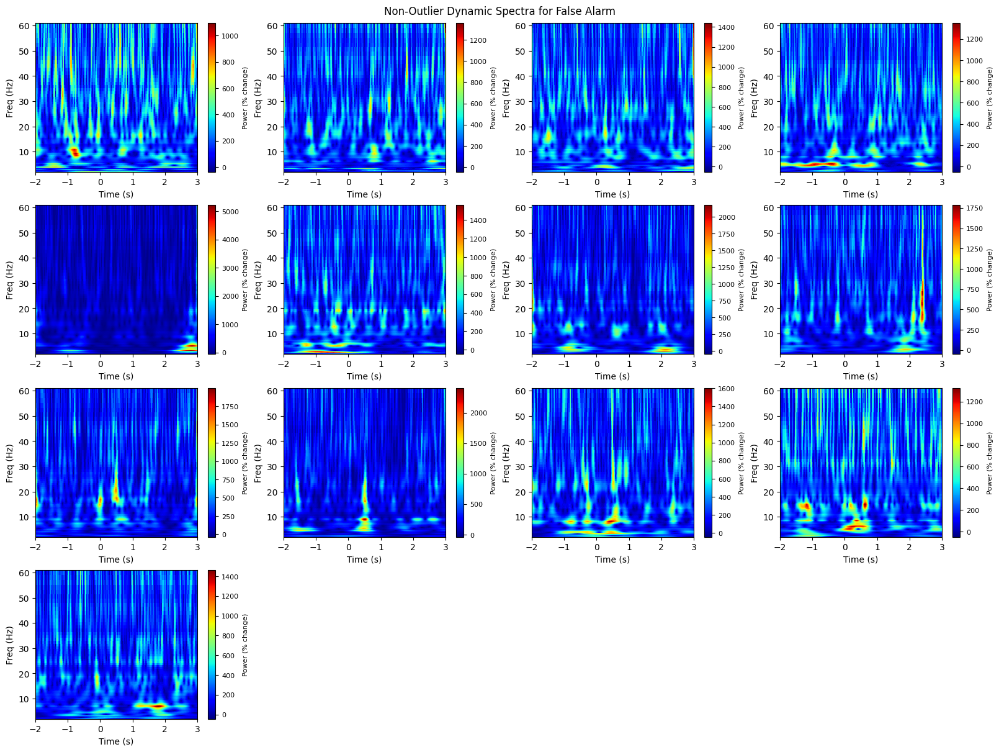

In [ ]:
trial_type = 'False Alarm'

with h5py.File(filename, 'r') as h5f:
    group = h5f[trial_type]
    all_power = group["DynamicSpectra"][()]
    freqs = group.attrs["Frequencies"][()]
    time_axis = group.attrs["Time_Array"][()]

plot_spectra_grid_norm([all_power[i] for i in range(len(all_power))], freqs, time_axis,
                                  title=f"Non-Outlier Dynamic Spectra for {trial_type}")